<a href="https://colab.research.google.com/github/AEydi/rsna-pneumonia-detection/blob/main/RSNA_Pneumonia_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction

### What Is Pneumonia?
Pneumonia, an inflammatory condition of the lungs, primarily affects the tiny air sacs called alveoli. Typical symptoms encompass a combination of a productive or dry cough, chest pain, fever, and breathing difficulties. The severity of the condition can vary. Pneumonia is commonly the result of viral or bacterial infections, though occasionally it may stem from other microorganisms, specific medications, or underlying conditions like autoimmune diseases. Risk factors encompass conditions such as cystic fibrosis, chronic obstructive pulmonary disease (COPD), asthma, diabetes, heart failure, a history of smoking, compromised coughing ability following conditions like stroke, and a weakened immune system.

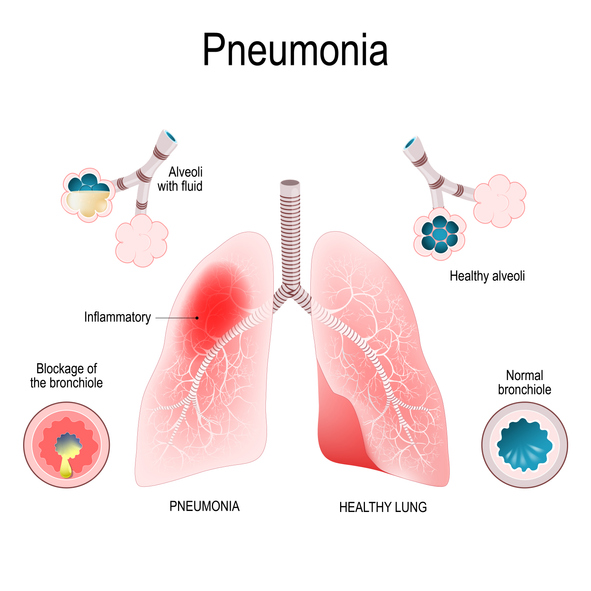


### Impact of Pneumonia
Pneumonia represents a significant global health concern, contributing to more than 15% of all fatalities among children under the age of 5 worldwide. In 2015, approximately 920,000 children under the age of 5 succumbed to this illness. In the United States, pneumonia accounts for more than 500,000 visits to emergency departments and led to over 50,000 fatalities in 2015, consistently ranking among the top 10 causes of death in the nation. Despite its prevalence, the accurate diagnosis of pneumonia remains a formidable challenge. It necessitates the expertise of highly trained specialists who review chest radiographs (CXR) and seek confirmation through clinical history, vital signs, and laboratory assessments. Pneumonia typically manifests as areas of increased opacity on CXR. Nevertheless, the process of diagnosing pneumonia from CXR images is intricate due to a multitude of other lung conditions, such as pulmonary edema, bleeding, atelectasis, lung cancer, or changes resulting from radiation or surgery. Beyond lung-related issues, pleural effusion, characterized by fluid in the pleural space, can also manifest as increased opacity on CXR. The comparison of CXRs taken at different times, along with correlation with clinical symptoms and history when available, assists in the diagnostic process. Given the extensive use of CXRs in medical practice, interpreting these images is compounded by factors like patient positioning and variations in the depth of inspiration. Moreover, healthcare professionals must manage the substantial workload of reviewing high volumes of images during their shifts.

# Setting up Environment

### Establishing Google Drive Connection

Before we embark on this project, it is essential to establish a connection to Google Drive. This connection will facilitate the storage and access of our Jupyter Notebook and other critical components, including log files.

In [ ]:
# Connect to Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Define the directory for saving project files
save_dir = "/content/drive/MyDrive/Colab Notebooks/Pneumonia_Detection/"

Mounted at /content/drive


### Installing Essential Libraries

In this section, we will install the libraries necessary for our project. These libraries consist of `MONAI`, `pydicom`, `tqdm`, `torchmetrics`, and `pytorch_lightning`.

In [ ]:
%pip install monai==1.2.0
%python -c "import matplotlib" || pip install -q matplotlib
%matplotlib inline
%pip install pydicom tqdm torchmetrics plotly pytorch_lightning

### Importing Essential Libraries

Once we have successfully installed the required libraries, our next step is to import them into our Jupyter Notebook. This step is crucial to make these libraries available for use throughout the entire notebook.

In [ ]:
# Data handling and manipulation
import os
import glob
import numpy as np
import pandas as pd

# Data visualization
import seaborn as sns
import matplotlib.pyplot as plt

# Machine learning and deep learning libraries
import sklearn.metrics as metrics
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchmetrics
import torchvision

# PyTorch Lightning for deep learning
import pytorch_lightning as pl
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning.loggers import TensorBoardLogger, CSVLogger

# Medical image processing using MONAI
from monai.data import Dataset, DataLoader, PersistentDataset
from monai.apps import download_and_extract
from monai.transforms import (
    Cropd,
    MapTransform,
    Compose,
    LoadImaged,
    Activationsd,
    AsDiscreted,
    LoadImaged,
    RandFlipd,
    RandAffined,
    RandRotated,
    RandZoomd,
    ScaleIntensityd,
    EnsureChannelFirstd,
    NormalizeIntensityd,
    HistogramNormalized,
    Resized,
    Rotate90d,
    Flipd,
    ToTensord,
    Lambdad,
)

# DICOM image processing
import pydicom
import cv2

# Progress monitoring
from tqdm.notebook import tqdm

# Data Preparation

### Downloading and Extracting Data:

To effectively address the challenge, we need to obtain the dataset provided by RSNA and Kaggle. This dataset consists of chest X-ray images and related information, serving as the foundation for our pneumonia detection project.

Before proceeding, ensure you are logged into your Kaggle account. Then, copy the download link of the dataset and paste it into the code cell below. The dataset will be downloaded and extracted into the `RSNA` folder.

In [ ]:
# Define the dataset download URL and target directory
url = "https://storage.googleapis.com/kaggle-competitions-data/kaggle-v2/10338/862042/bundle/archive.zip?GoogleAccessId=web-data@kaggle-161607.iam.gserviceaccount.com&Expires=1698362887&Signature=sWYdCi26Ud%2FJjSrKfqkkdWBUoAmQkvoCocZDWqEXbvZcg7%2FrtVvmPwnjHj28ZSSN4vH4zT9kk7e9nDj1%2BZSkZZTcWe2F921EVYAHZwcRVmS8rgtIhL9NmhPgLHicMZ49wsejjOsIWYTVrXTASBAfoXz78SjpmnoKnVpkWelp9bPstNArUbUlfmvRJJiEHJqXL1e81Y4brOh5Pbex3X0Wy7dhAdjz7EuIyJqtKFjqzGGqKq%2F3EzpcTRjSbQKC5XP4yr1itJd1gN17dTbRoXbVl4Q101nh1Z8MCsTFtW4AmNCp1junKW6BQakF%2F3gqbt0QQHW9EdbnByzelpk2ChzNPQ%3D%3D&response-content-disposition=attachment%3B+filename%3Drsna-pneumonia-detection-challenge.zip"
directory = "/content/"
file_name = "RSNA.zip"
compressed_file = os.path.join(directory, file_name)

# Download and extract the dataset
download_and_extract(url, compressed_file, directory)

BRATS21.zip: 3.66GB [00:53, 73.8MB/s]                            

2023-10-24 04:41:57,909 - INFO - Downloaded: /content/BRATS21.zip
2023-10-24 04:41:57,911 - INFO - Expected md5 is None, skip md5 check for file /content/BRATS21.zip.
2023-10-24 04:41:57,913 - INFO - Writing into directory: /content/.


### Data Exploration and Preprocessing:

In this section, we'll load the data from a CSV file, store it in a dataframe, and explore the dataset.

In [ ]:
# Read the labels data from the CSV file and fill missing values with 0
labels = pd.read_csv(directory + "/stage_2_train_labels.csv")
labels.fillna(0, inplace=True)

# Display the first 5 rows of the dataframe to understand the data structure
labels.head()

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,0.0,0.0,0.0,0.0,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,0.0,0.0,0.0,0.0,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,0.0,0.0,0.0,0.0,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,0.0,0.0,0.0,0.0,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1


The following code cell will show the distribution of classes in the dataset. that shows 2/3 of the patients do not have pneumonia (with target value = 0) and 1/3 of the patients have pneumonia (with target value =1)

In [ ]:
pd.pivot_table(labels, index=["Target"], values=['patientId'], aggfunc='count')

,patientId
Target,
0,20672
1,9555


In the dataset, certain patients exhibit multiple rows of information, signifying the presence of pneumonia in multiple locations within their lungs, which have been segmented and labeled for analysis.

In [ ]:
labels['patientId'].value_counts().value_counts()

1    23286
2     3266
3      119
4       13
Name: patientId, dtype: int64

Randomly shuffle the rows in the dataframe and remove duplicate patientId entries.

In [ ]:
labels = labels.sample(frac = 1)
labels.drop_duplicates(subset=['patientId'], inplace=True)
labels.head(10)

,x,y,width,height,Target
patientId,,,,,
d6ccb839-1988-4113-8233-c7698065a8a1,0.0,0.0,0.0,0.0,0
5abb604e-6aa1-4cc0-8ef0-eda7cdc047a8,0.0,0.0,0.0,0.0,0
2c68016e-5a63-4430-a834-efe5d43edd0e,125.0,646.0,184.0,137.0,1
7495b380-25a3-4dfb-9da3-630f6288728f,0.0,0.0,0.0,0.0,0
8df52c85-df58-45e1-9142-7bcdd4d22f71,0.0,0.0,0.0,0.0,0
58b9904a-1e44-40ea-86a6-c0b9d32899f9,0.0,0.0,0.0,0.0,0
32b9ab38-2dc3-471b-87d8-4a67f49bfb7c,635.0,422.0,188.0,315.0,1
497f010c-5091-467a-bc3e-2c948ee696b0,0.0,0.0,0.0,0.0,0
dcaafe3f-11bf-4341-8c3e-5f65c7dc5972,0.0,0.0,0.0,0.0,0


In this cell, we prepare lists that will be used to create datasets for training and visualizing the data. These lists contain information about the image files and their corresponding labels.

In [ ]:
# Define the path to the directory containing the image files
path = "/content/stage_2_train_images/"

# Initialize empty dictionaries to store data
data_dic_vis = []
data_dic_train = []

# Create data dictionaries for visualization and training datasets
data_dic_vis = [{"id": id, "image": path + id + ".dcm", "label": int(label)} for id, label in zip(labels.index, labels.Target)]
data_dic_train = [{"image": path + id + ".dcm", "label": int(label)} for id, label in zip(labels.index, labels.Target)]

# Display the first 5 entries in the data dictionary for visualization
data_dic_vis[:5]

[{'id': '36a9f078-981f-47fd-87eb-e8be3ac35082',
  'image': '/content/stage_2_train_images/36a9f078-981f-47fd-87eb-e8be3ac35082.dcm',
  'label': 1},
 {'id': 'a77b8b2a-4755-47d4-970b-8b4accc1cda1',
  'image': '/content/stage_2_train_images/a77b8b2a-4755-47d4-970b-8b4accc1cda1.dcm',
  'label': 0},
 {'id': '168ae18f-d50a-4df3-9f21-5eedb100fcc0',
  'image': '/content/stage_2_train_images/168ae18f-d50a-4df3-9f21-5eedb100fcc0.dcm',
  'label': 0},
 {'id': '5e7a197f-e287-4d83-8094-9d7eee2d1269',
  'image': '/content/stage_2_train_images/5e7a197f-e287-4d83-8094-9d7eee2d1269.dcm',
  'label': 0},
 {'id': 'f178cab2-d7e5-49e6-a548-74c08791d2bb',
  'image': '/content/stage_2_train_images/f178cab2-d7e5-49e6-a548-74c08791d2bb.dcm',
  'label': 0}]

### Loading Images and Extracting Metadata

In this section, we load the original images from the dataset and extract relevant metadata. We will also extract the patient's sex and age from the metadata and incorporate them into the `labels` dataframe.

In [ ]:
# Define a custom transformation class to read and process DICOM files
class ReadDicomd(MapTransform):
    def __init__(self, keys):
        super().__init__(keys)
        self.keys = keys

    def __call__(self, data):
        d = dict(data)
        for key in self.keys:
            data = pydicom.read_file(d[key])
            d[key] = data.pixel_array
            meta_data = {attribute: getattr(data, attribute) for attribute in dir(data) if attribute[0].isupper()}
            del meta_data["PixelData"]
            d["image_meta_dict"] = meta_data
        return d

# Define a series of image loading and preprocessing transformations
image_loader_transforms = Compose(
    [
        ReadDicomd(keys=["image"]),  # Read and load the DICOM image
        EnsureChannelFirstd(keys=["image"], channel_dim="no_channel"),  # Ensure proper channel format
    ]
)

# Create a dataset with the original data and apply the image loading transformations
original_data = Dataset(data_dic, transform=image_loader_transforms)


In [ ]:
# Add sex and age information to the labels dataframe
for i in tqdm(range(len(original_data))):
    data = original_data[i]
    labels.at[data["id"], "sex"] = data["image_meta_dict"]["PatientSex"]
    labels.at[data["id"], "age"] = data["image_meta_dict"]["PatientAge"]

# Fill missing values with 0, if any
labels.fillna(0, inplace=True)

# Display the first few rows of the updated labels dataframe
labels.head()

  0%|          | 0/26684 [00:00<?, ?it/s]

,x,y,width,height,Target,sex,age
patientId,,,,,,,
0004cfab-14fd-4e49-80ba-63a80b6bddd6,0.0,0.0,0.0,0.0,0,F,51
00313ee0-9eaa-42f4-b0ab-c148ed3241cd,0.0,0.0,0.0,0.0,0,F,48
00322d4d-1c29-4943-afc9-b6754be640eb,0.0,0.0,0.0,0.0,0,M,19
003d8fa0-6bf1-40ed-b54c-ac657f8495c5,0.0,0.0,0.0,0.0,0,M,28
00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,F,32


#### Pneumonia Cases by Gender
To better understand the distribution of pneumonia cases by gender, we create a pie chart that illustrates the proportion of cases for women and men with and without pneumonia.

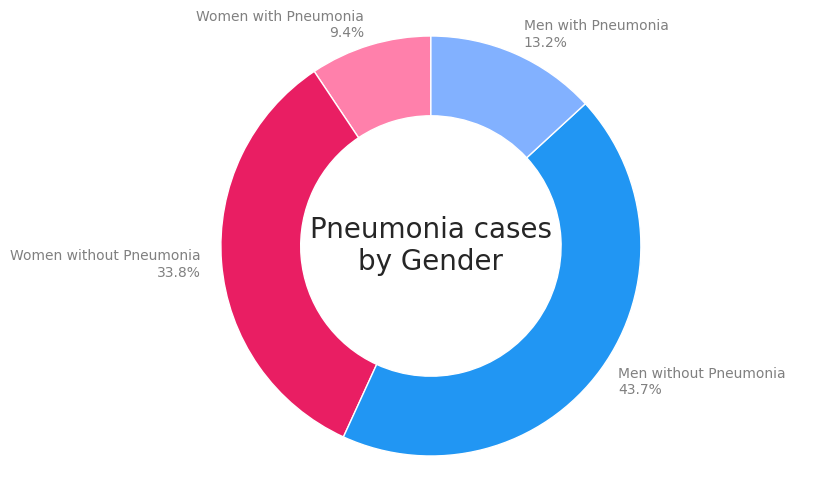

In [ ]:
cases_counts = labels.value_counts(["sex", "Target"]).to_dict()
women_with_pneumonia = cases_counts.get(('F', 1), 0)
women_without_pneumonia = cases_counts.get(('F', 0), 0)
men_with_pneumonia = cases_counts.get(('M', 1), 0)
men_without_pneumonia = cases_counts.get(('M', 0), 0)

chart_labels = ['Women with Pneumonia', 'Women without Pneumonia', 'Men without Pneumonia', 'Men with Pneumonia']
values = [women_with_pneumonia, women_without_pneumonia, men_without_pneumonia, men_with_pneumonia]

# Create a pie chart with a white center
fig, ax = plt.subplots(figsize=(10, 6))
wedges, texts = ax.pie(values, labels=chart_labels, startangle=90,
                                  colors=['#FF80AB', '#E91E63', '#2196F3', '#82B1FF'],
                                  wedgeprops=dict(width=0.38, edgecolor='w'))  # Set width to create a white center
ax.axis('equal')

# Customize the style using Seaborn
sns.set_style("whitegrid")
sns.set_palette(sns.color_palette(["#E91E63", "#2196F3", "#82B1FF", "#FF80AB"]))
sns.despine(left=True)

# Add a title in the center
ax.text(0, 0, "Pneumonia cases\nby Gender", ha='center', va='center', fontsize=20)

# Add percentages alongside labels
for t, at in zip(texts, autotexts):
    label = t.get_text()
    percentage = at.get_text()
    t.set_text(f"{label}\n{percentage}")
    t.set_color('gray')

plt.show()

#### Pneumonia Cases by Age
Next, we explore the distribution of pneumonia cases by age.

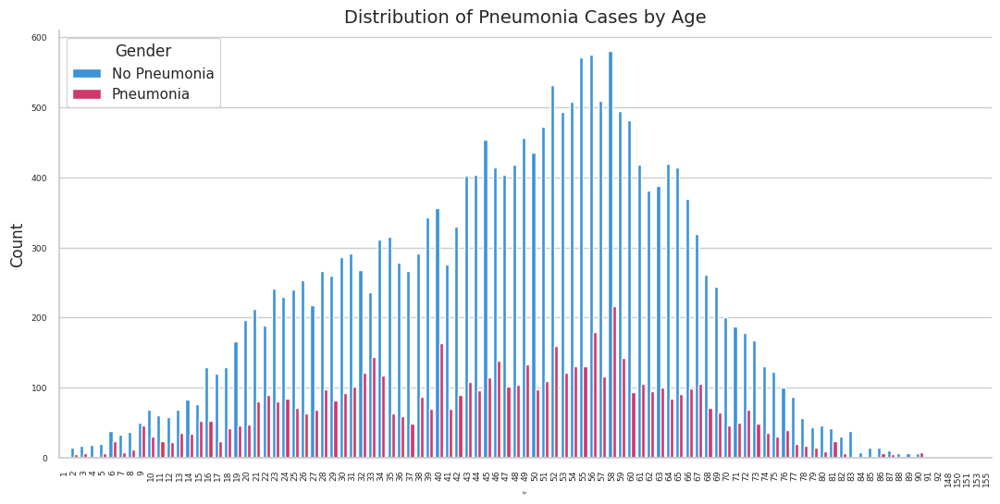

In [ ]:
# Assuming that 'labels' is a DataFrame with columns 'age' and 'Target'
cases_counts = labels.groupby(['age', 'Target']).size().reset_index(name='Counts')

# Sort the DataFrame by 'age'
cases_counts['age'] = cases_counts['age'].astype(int)

# Set a smaller font size for the plot
sns.set(font_scale=0.6)  # Adjust the scaling factor as needed

# Create a bar plot using Seaborn with sorted x-axis
plt.figure(figsize=(13, 6))
sns.set_style("whitegrid")
sns.barplot(data=cases_counts, x="age", y="Counts", hue="Target", palette={0: '#2196F3', 1: '#E91E63'})
# Remove the gridlines
sns.despine()
sns.set(style="white")
# Customize the plot
plt.title("Distribution of Pneumonia Cases by Age", fontsize=14)  # Adjust the title font size
plt.xlabel("Age", fontsize=2)  # Adjust the x-axis label font size
plt.ylabel("Count", fontsize=12)  # Adjust the y-axis label font size
plt.legend(title="Gender", labels=["No Pneumonia", "Pneumonia"], fontsize=10)  # Adjust the legend font size
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
legend = plt.legend(title="Gender")
legend.get_texts()[0].set_text("No Pneumonia")
legend.get_texts()[1].set_text("Pneumonia")

plt.show()

#### Visualizing Images

In this section, we visualize a random set of chest X-ray images from the dataset

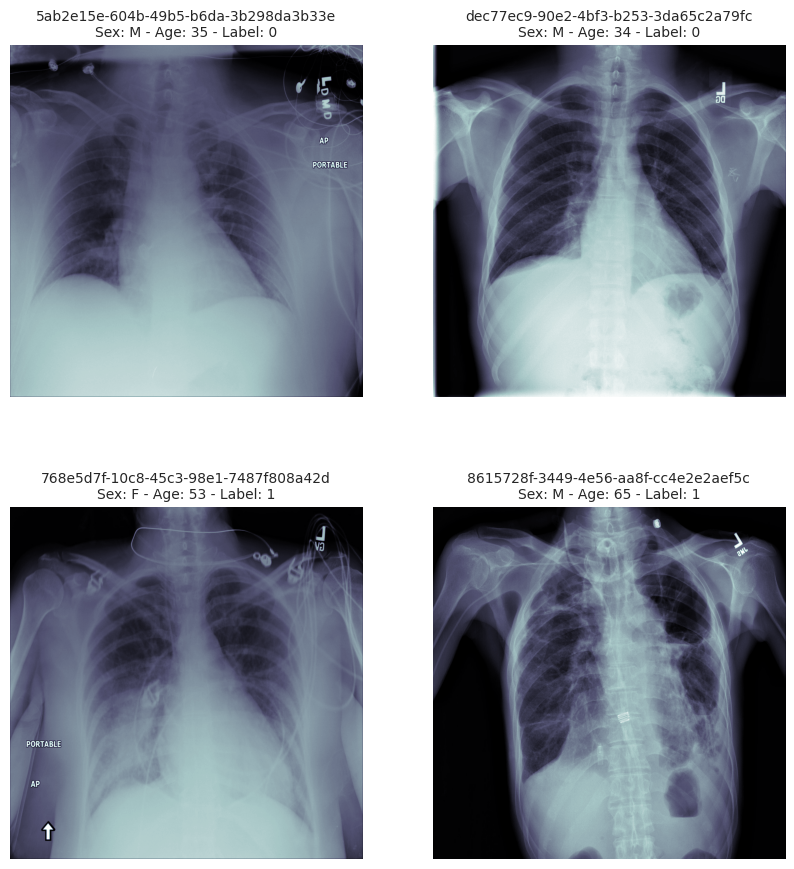

In [ ]:
# Create a 2x2 grid of subplots to display images and information
fig, axis = plt.subplots(2, 2, figsize=(10, 11))

# Randomly select and display chest X-ray images with associated details
for i in range(2):
    for j in range(2):
        random_index = np.random.randint(0, len(original_data))
        data = original_data[random_index]
        x_ray = data["image"]
        Id = data["id"]
        sex = "Sex: " + data["image_meta_dict"]["PatientSex"]
        age = "Age: " + str(data["image_meta_dict"]["PatientAge"])
        label = "Label: " + str(labels.loc[Id]["Target"])

        # Create a title that includes image ID, sex, age, and label
        title = f"{Id}\n{sex} - {age} - {label}"

        # Display the X-ray image with title
        axis[i][j].imshow(x_ray[0], cmap='bone')
        axis[i][j].set_title(title, fontsize=10)

        # Remove the grid from subplots
        axis[i][j].axis('off')

# Show the 2x2 grid of X-ray images
plt.show()

As evident from our dataset, there is an imbalance between the classes, which can result in issues such as a bias towards the majority class, challenges in generalization, and susceptibility to overfitting. To address this, I have made the decision to rebalance the dataset by retaining all pneumonia cases while reducing the number of non-pneumonia cases to 8000.

In [ ]:
data_pos = labels[labels.Target == 1]
data_pos.head()

,patientId,x,y,width,height,Target
11082,74075cca-a426-4710-92de-e23aa74b76ac,644.0,292.0,193.0,300.0,1
10839,722ad9c3-919a-4c08-bb67-cafd603ba754,607.0,220.0,183.0,325.0,1
1218,104c55a0-70a6-49a7-a677-c170d356372a,192.0,398.0,249.0,282.0,1
12095,7c1a130b-a944-431a-a2b1-735483a46c12,656.0,529.0,193.0,434.0,1
178,05b91b32-5635-4071-b45d-6a73f8eea918,160.0,264.0,317.0,501.0,1


In [ ]:
data_neg = labels[labels.Target == 0]
data_neg.head()

,patientId,x,y,width,height,Target
27959,f7e14331-ae8f-4367-8ca3-93699785e0e2,0.0,0.0,0.0,0.0,0
19394,b440e00a-6791-4d75-8204-94ad0dacfe65,0.0,0.0,0.0,0.0,0
14925,92bb404a-2703-4288-ba3b-81f4d60be155,0.0,0.0,0.0,0.0,0
14825,91ce2ffb-5eb8-4f4d-afc8-af618e865f02,0.0,0.0,0.0,0.0,0
27832,f6e624f8-75fd-4f03-9119-24a617008e2b,0.0,0.0,0.0,0.0,0


In [ ]:
labels = data_pos.append(data_neg[0:8000], ignore_index=True)
labels = labels.sample(frac = 1)
labels.head()

<ipython-input-188-3f141bb68d44>:1: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



,patientId,x,y,width,height,Target
20447,fb99325c-b1f6-422f-8b20-b6fab98c8fcc,0.0,0.0,0.0,0.0,0
21622,56bab623-fa84-4335-8874-773e5f6c966c,0.0,0.0,0.0,0.0,0
1066,9df32a52-a507-4385-b49d-12fbdaeb22bf,0.0,0.0,0.0,0.0,0
4962,370e4257-86fb-40b7-a4df-b8a3a7b25226,181.0,157.0,282.0,603.0,1
2733,6a564802-a75c-4a40-957b-110303263bf7,0.0,0.0,0.0,0.0,0


### Defining Data Transformations

In this section, we establish a set of transformations that will be applied to the chest X-ray images. These transformations serve to prepare the data for training and validation. The transformations include:

1- `Resizing`: The images are resized to dimensions of 224x224, which is suitable for the model.

2- `Histogram Normalization`: This process enhances image contrast, ensuring consistent brightness and clarity.

3- `Scaling Intensity Range`: The intensity values in the images are scaled from the range [0, 255] to [0, 1].

4- `Random Rotations`: Images are randomly rotated by up to 10 degrees, introducing variability for robust training.

5- `Random Zoom`: Images undergo random zooming by a factor ranging from 0.8 to 1.2.

In [ ]:
class ReadDicomd(MapTransform):
    def __init__(self, keys):
        super().__init__(keys)
        self.keys = keys
    def __call__(self, data):
        d = dict(data)
        for key in self.keys:
            data = pydicom.read_file(d[key])
            d[key] = data.pixel_array
            meta_data = {attribute: getattr(data, attribute) for attribute in dir(data) if attribute[0].isupper()}
            del meta_data["PixelData"]
            d["image_meta_dict"] = meta_data
        return d

train_transforms = Compose(
    [
        # Deterministic non-randomized transforms
        ReadDicomd(keys=["image"]),
        EnsureChannelFirstd(keys=["image"], channel_dim="no_channel"),
        Resized(keys=["image"], spatial_size=(224, 224)),
        HistogramNormalized(keys=["image"]),
        ScaleIntensityd(keys=["image"]),

        # Randomized transforms
        RandZoomd(keys=["image"], prob=0.5, min_zoom=0.8, max_zoom=1.2),
        RandRotated(keys=["image"], prob=0.5, range_x=np.pi/18),
        ToTensord(keys=["image"]),
    ]
)

val_transforms = Compose(
    [
        # Deterministic non-randomized transforms
        ReadDicomd(keys=["image"]),
        EnsureChannelFirstd(keys=["image"], channel_dim="no_channel"),
        Resized(keys=["image"], spatial_size=(224, 224)),
        HistogramNormalized(keys=["image"]),
        ScaleIntensityd(keys=["image"]),
    ]
)

let's see how the images look after applying the transformations.

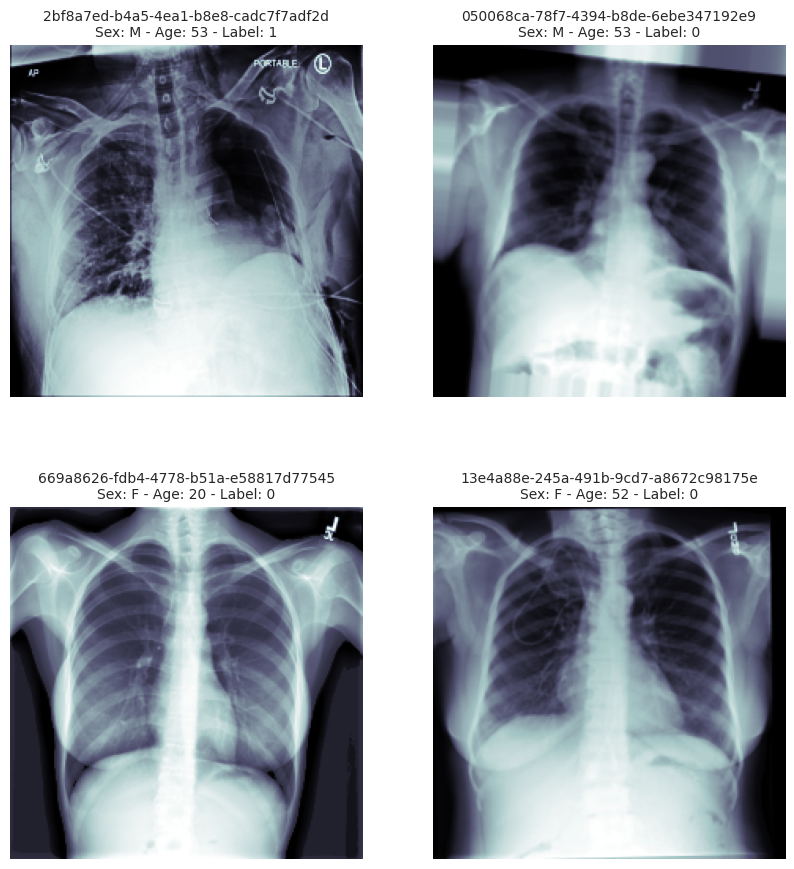

In [ ]:
transformed_dataset = Dataset(data_dic_vis, transform=train_transforms)
fig, axis = plt.subplots(2, 2, figsize=(10, 11))
for i in range(2):
    for j in range(2):
        random_index = np.random.randint(0, len(transformed_dataset))
        data = transformed_dataset[random_index]
        x_ray = data["image"]
        Id = data["id"]
        sex = "Sex: " + data["image_meta_dict"]["PatientSex"]
        age = "Age: " + str(data["image_meta_dict"]["PatientAge"])
        label = "Label: " + str(labels.loc[Id]["Target"])

        title = Id + "\n" + sex + " - " + age + " - " + label
        axis[i][j].imshow(x_ray[0], cmap='bone')
        axis[i][j].set_title(title,fontsize=10)

        # Remove the grid from subplots
        axis[i][j].axis('off')

plt.show()

### Defining the Datasets and DataLoaders
In this section, we will define the datasets and dataloaders that will be used for training and testing the model.

In [ ]:
size_of_train = 12000
size_of_val = 2000
train_dataset = PersistentDataset(data_dic_train[:size_of_train], transform=train_transforms, cache_dir="/content/cache")
val_dataset = PersistentDataset(data_dic_train[size_of_train:], transform=val_transforms, cache_dir="/content/cache")

In [ ]:
batch_size = 100
num_workers = 2

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=num_workers)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=num_workers)

# Model Definition and Training Setup
In this section, we define our pneumonia detection model and set up the training and validation configurations.

In [ ]:
# define the model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class PneumoniaModel(pl.LightningModule):
    def __init__(self):
        super().__init__()
        # resnet18 with pretrained weights
        self.model = torchvision.models.resnet18(pretrained=True)
        self.model.conv1 = torch.nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)

        # add dropout to the model.fc layer
        self.model.fc = torch.nn.Sequential(
            torch.nn.Dropout(p=0.5),
            torch.nn.Linear(in_features=512, out_features=1, bias=True)
        )


        self.optimizer = torch.optim.Adam(self.model.parameters(), lr=1e-4)
        self.loss_fn = torch.nn.BCEWithLogitsLoss(pos_weight=torch.tensor([3]))

        # metrics
        # accuracy
        self.train_acc = torchmetrics.Accuracy(task="binary")
        self.val_acc = torchmetrics.Accuracy(task="binary")

        # precision
        self.train_precision = torchmetrics.Precision(task="binary")
        self.val_precision = torchmetrics.Precision(task="binary")

        # recall
        self.train_recall = torchmetrics.Recall(task="binary")
        self.val_recall = torchmetrics.Recall(task="binary")

        # auc
        self.train_auc = torchmetrics.AUROC(task="binary")
        self.val_auc = torchmetrics.AUROC(task="binary")

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch['image'], batch['label'].unsqueeze(1)
        y = y.float()
        y_hat = self(x)
        loss = self.loss_fn(y_hat, y)
        self.log("train_loss", loss)
        self.train_acc(torch.sigmoid(y_hat), y)
        self.train_precision(torch.sigmoid(y_hat), y)
        self.train_recall(torch.sigmoid(y_hat), y)
        self.train_auc(torch.sigmoid(y_hat), y)
        return loss

    def on_train_epoch_end(self) -> None:
        self.log("train_acc", self.train_acc.compute())
        self.log("train_precision", self.train_precision.compute())
        self.log("train_recall", self.train_recall.compute())
        self.log("train_auc", self.train_auc.compute())

    def validation_step(self, batch, batch_idx):
        x, y = batch['image'], batch['label'].unsqueeze(1)
        y = y.float()
        y_hat = self(x)
        loss = self.loss_fn(y_hat, y)
        self.log("val_loss", loss)
        self.val_acc(torch.sigmoid(y_hat), y)
        self.val_precision(torch.sigmoid(y_hat), y)
        self.val_recall(torch.sigmoid(y_hat), y)
        self.val_auc(torch.sigmoid(y_hat), y)
        return loss

    def on_validation_epoch_end(self) -> None:
        self.log("val_acc", self.val_acc.compute())
        self.log("val_precision", self.val_precision.compute())
        self.log("val_recall", self.val_recall.compute())
        self.log("val_auc", self.val_auc.compute())

    def configure_optimizers(self):
        return [self.optimizer]

model = PneumoniaModel()


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning:

The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning:

Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 87.3MB/s]


### Checkpoint Configuration

In [ ]:
checkpoint_callback = ModelCheckpoint(
    monitor="val_auc",
    dirpath="checkpoints1",
    save_top_k=3,
    mode="max",
)

### Defining the Trainer

In [ ]:
trainer = pl.Trainer(
    accelerator="gpu",
    devices=1,
    max_epochs=20,
    log_every_n_steps=1,
    callbacks=[checkpoint_callback],
    logger=CSVLogger(save_dir=directory + "/log", name="pneumonia"),
)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


### Model Training
In this section, we initiate the training process for our pneumonia detection model and save the trained model's state.

In [ ]:
# load model weights from saved pneumonia_model.pt and resume training
model.load_state_dict(torch.load(os.path.join(directory, "pneumonia_model.pt")))
trainer.fit(model, train_loader, val_loader)
torch.save(model.state_dict(), os.path.join(directory, "pneumonia_model.pt"))

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name            | Type              | Params
------------------------------------------------------
0 | model           | ResNet            | 11.2 M
1 | loss_fn         | BCEWithLogitsLoss | 0     
2 | train_acc       | BinaryAccuracy    | 0     
3 | val_acc         | BinaryAccuracy    | 0     
4 | train_precision | BinaryPrecision   | 0     
5 | val_precision   | BinaryPrecision   | 0     
6 | train_recall    | BinaryRecall      | 0     
7 | val_recall      | BinaryRecall      | 0     
8 | train_auc       | BinaryAUROC       | 0     
9 | val_auc         | BinaryAUROC       | 0     
------------------------------------------------------
11.2 M    Trainable params
0         Non-trainable params
11.2 M    Total params
44.683    Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=20` reached.


### Plotting Model Metrics
In this section, we visualize the performance metrics of our pneumonia detection model during and after training.

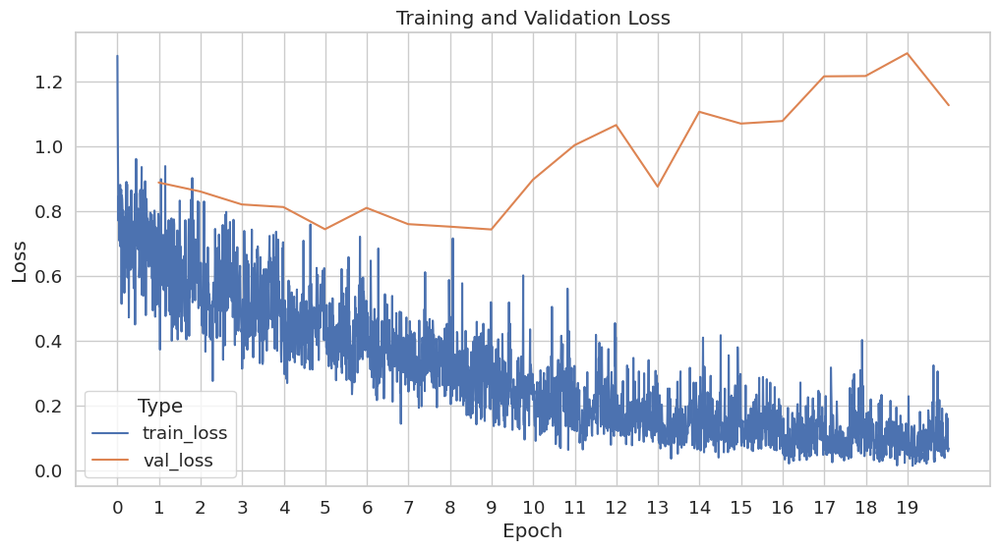

In [ ]:
# plot the training and validation loss
loss_df = pd.read_csv(directory + "/metrics (4).csv")
loss_df = loss_df[["step", "epoch", "train_loss", "val_loss"]]
loss_df = loss_df.melt(id_vars="step", value_vars=["train_loss", "val_loss"], var_name="type", value_name="loss")
loss_df["step"] = loss_df["step"].astype(int)


plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")

# Create the line plot
g = sns.lineplot(data=loss_df, x="step", y="loss", hue="type")
g.set(title="Training and Validation Loss", xlabel="Epoch", ylabel="Loss")
g.legend(title="Type")
plt.xticks(range(0, 2400, 120), range(20))

plt.show()

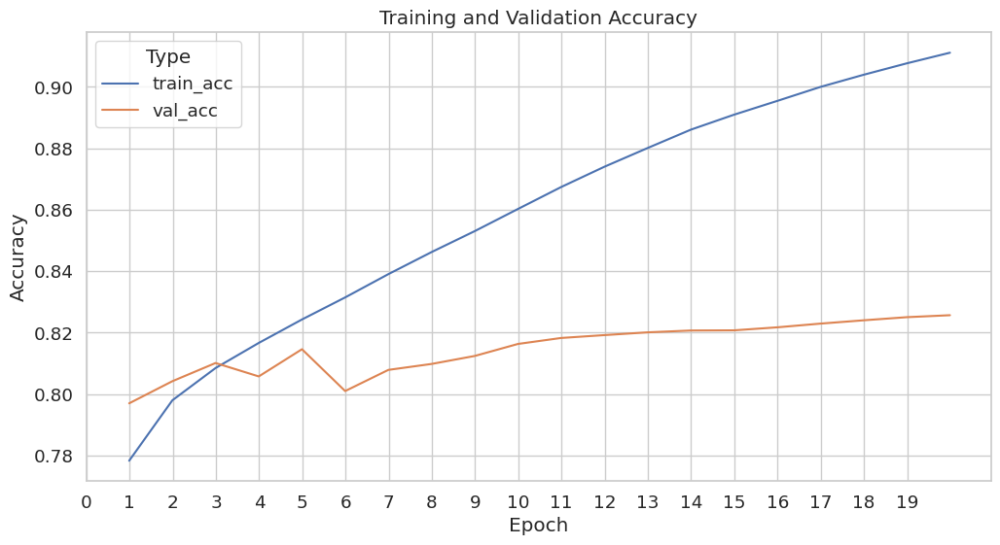

In [ ]:
# Read the precision data
acc_df = pd.read_csv(directory + "/log/pneumonia/version_0/metrics.csv")
acc_df = acc_df[["step", "epoch", "train_acc", "val_acc"]]
acc_df = acc_df.melt(id_vars="step", value_vars=["train_acc", "val_acc"], var_name="type", value_name="accuracy")
acc_df["step"] = acc_df["step"].astype(int)

plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")

# Create the line plot
g = sns.lineplot(data=acc_df, x="step", y="accuracy", hue="type")
g.set(title="Training and Validation Accuracy", xlabel="Epoch", ylabel="Accuracy")
g.legend(title="Type")
plt.xticks(range(0, 2400, 120), range(20))

plt.show()

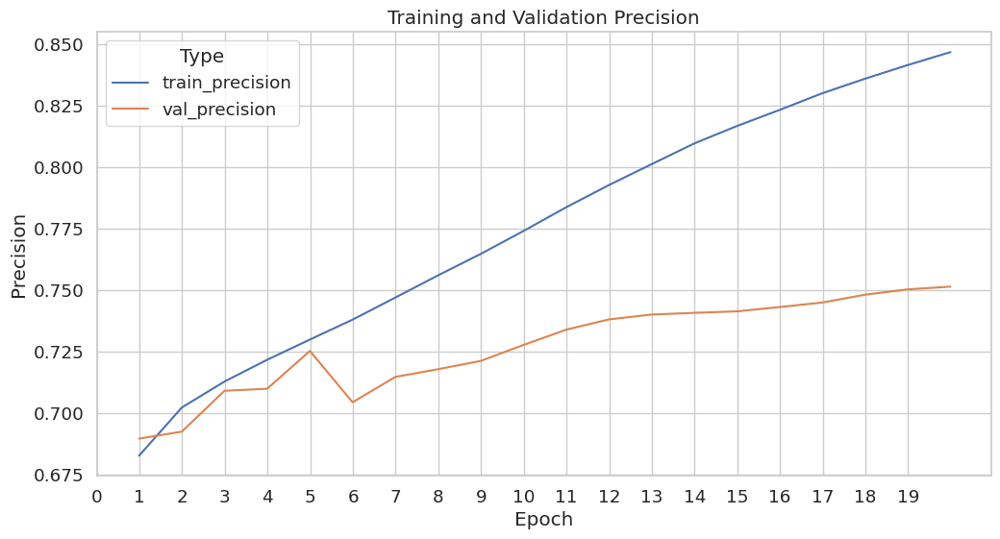

In [ ]:
# Read the precision data
precision_df = pd.read_csv(directory + "metrics (3).csv")
precision_df = precision_df[["step", "epoch", "train_precision", "val_precision"]]
precision_df = precision_df.melt(id_vars="step", value_vars=["train_precision", "val_precision"], var_name="type", value_name="precision")
precision_df["step"] = precision_df["step"].astype(int)

plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")

# Create the line plot
g = sns.lineplot(data=precision_df, x="step", y="precision", hue="type")
g.set(title="Training and Validation Precision", xlabel="Epoch", ylabel="Precision")
g.legend(title="Type")
plt.xticks(range(0, 2400, 120), range(20))

plt.show()

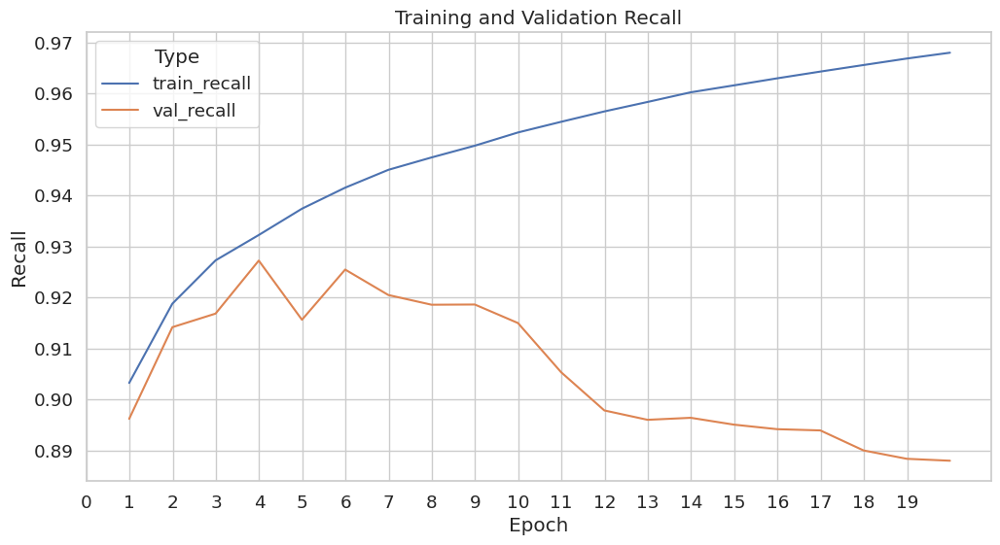

In [ ]:
# Read the recall data
recall_df = pd.read_csv(directory + "/log/pneumonia/version_0/metrics.csv")
recall_df = recall_df[["step", "epoch", "train_recall", "val_recall"]]
recall_df = recall_df.melt(id_vars="step", value_vars=["train_recall", "val_recall"], var_name="type", value_name="recall")
recall_df["step"] = recall_df["step"].astype(int)

plt.figure(figsize=(12, 6))
sns.set_style("whitegrid")

# Create the line plot
g = sns.lineplot(data=recall_df, x="step", y="recall", hue="type")
g.set(title="Training and Validation Recall", xlabel="Epoch", ylabel="Recall")
g.legend(title="Type")
plt.xticks(range(0, 2400, 120), range(20))

plt.show()

In [ ]:
model = PneumoniaModel.load_from_checkpoint(checkpoint_callback.best_model_path)
model.eval()
model.to(device)
y_preds = np.zeros(len(val_dataset))
y_true = np.zeros(len(val_dataset))
i = 0
k = 0
with torch.no_grad():
    for batch in val_loader:
        x, y = batch['image'], batch['label'].unsqueeze(1)
        x = x.to(device).float()
        y_hat = torch.sigmoid(model(x)).cpu()
        y_hat = y_hat[:, 0].numpy()
        y = y[:, 0].numpy()
        for j in range(len(y_hat)):
            y_preds[i] = y_hat[j]
            y_true[i] = y[j]
            i+=1

y_preds = torch.tensor(y_preds)
y_true = torch.tensor(y_true).int()


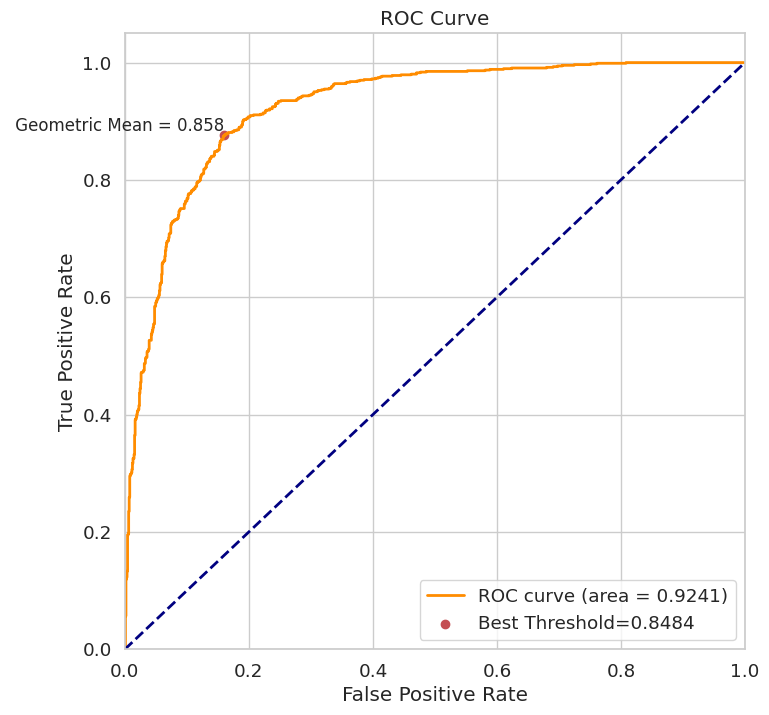

In [ ]:
fpr, tpr, thresholds = torchmetrics.ROC(task="binary")(y_preds, y_true)
gmeans = np.sqrt(tpr * (1-fpr))
ix = np.argmax(gmeans)
best_threshold = thresholds.numpy()[ix]
plt.figure(figsize=(8, 8))
sns.set_style("whitegrid")

# Plot the ROC curve
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %.4f)' % auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.scatter(fpr[ix], tpr[ix], marker='o', color='r', label='Best Threshold=%.4f' % thresholds[ix])
plt.text(fpr[ix], tpr[ix], f' Geometric Mean = {gmeans[ix]:.3f}', fontsize=12, ha='right', va='bottom')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')

plt.show()

In [ ]:
acc = torchmetrics.Accuracy(task="binary", threshold=best_threshold)(y_preds, y_true)
precision = torchmetrics.Precision(task="binary", threshold=best_threshold)(y_preds, y_true)
recall = torchmetrics.Recall(task="binary", threshold=best_threshold)(y_preds, y_true)
auc = torchmetrics.AUROC(task="binary")(y_preds, y_true)
confusion_matrix = torchmetrics.ConfusionMatrix(task="binary", num_classes=2, threshold=best_threshold)(y_preds, y_true)

print(f"Accuracy: {acc}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"AUC: {auc}")

Accuracy: 0.8548707962036133
Precision: 0.8042553067207336
Recall: 0.875
AUC: 0.9241434335708618


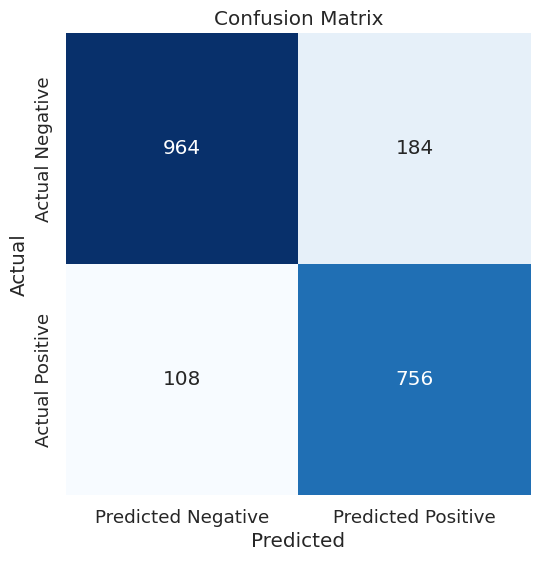

In [ ]:
# Create a Seaborn heatmap for the confusion matrix
plt.figure(figsize=(6, 6))
sns.set(font_scale=1.2)
sns.heatmap(confusion_matrix, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])

plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('Actual')

plt.show()

# Visualizing Activation Maps
In this section, we delve into the model's inner workings to gain a deeper understanding of its decision-making processes. Activation maps, also known as feature maps, provide valuable insights into how the model interprets and processes input images.
This analysis allows us to interpret the model's behavior and identify the regions or patterns in the images that influence its predictions. By visualizing activation maps, we gain valuable insights into the model's decision boundaries and can further refine its performance if necessary. This interpretability is particularly useful for building trust in the model's predictions and understanding its strengths and limitations.

In [ ]:
class ActivationMapModel(pl.LightningModule):
    def __init__(self):
        super().__init__()
        self.model = torchvision.models.resnet18()
        self.model.conv1 = torch.nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
        self.model.fc = torch.nn.Linear(in_features=512, out_features=1)
        self.feature_map = torch.nn.Sequential(*list(self.model.children())[:-2])

    def forward(self, x):
        feature_map = self.feature_map(x)
        avg_pool_output = torch.nn.functional.adaptive_avg_pool2d(input=feature_map, output_size=(1, 1))
        avg_output_flatten = torch.flatten(avg_pool_output)
        pred = self.model.fc(avg_output_flatten)
        return pred, feature_map

In [ ]:
model = ActivationMapModel()
model.load_state_dict(torch.load("/content/pneumonia_model.pt"), strict=False)
model.to(device)
model.eval()

In [ ]:
def cam(model, img):
    with torch.no_grad():
        pred, freatures = model(img.unsqueeze(0).unsqueeze(0))

    freatures = freatures.reshape((512, 49))
    weights_params = list(model.model.fc.parameters())[0]
    weight = weights_params.detach()

    cam = torch.matmul(weight, freatures)
    cam_img = cam.reshape(7, 7).cpu()
    return cam_img, torch.sigmoid(pred).cpu().numpy()[0]

In [ ]:
from matplotlib.patches import Rectangle
def visualize_cam(img, cam_img, pred, data, target):
    cam_img = transforms.functional.resize(cam_img.unsqueeze(0), size=(224, 224))[0]*-1
    fig, axis = plt.subplots(1, 2, figsize=(10, 11))
    axis[0].imshow(img, cmap='bone')
    axis[1].imshow(img, cmap='bone')
    axis[1].imshow(cam_img, cmap='jet', alpha=0.3)
    for _, row in data.iterrows():
        x, y, w, h = row.x*0.21875, row.y*0.21875, row.width*0.21875, row.height*0.21875
        rectangle = Rectangle(xy=(x,y),width=w, height=h, edgecolor="red",fc="none", alpha = 0.5)
        axis[0].add_patch(rectangle)
    if target:
        axis[0].set_title("Actual place of Pneumonia")
    else:
        axis[0].set_title("No Pneumonia")
    plt.title("Predicated place of Pneumonia " if pred < 0.5 else "No Pneumonia")


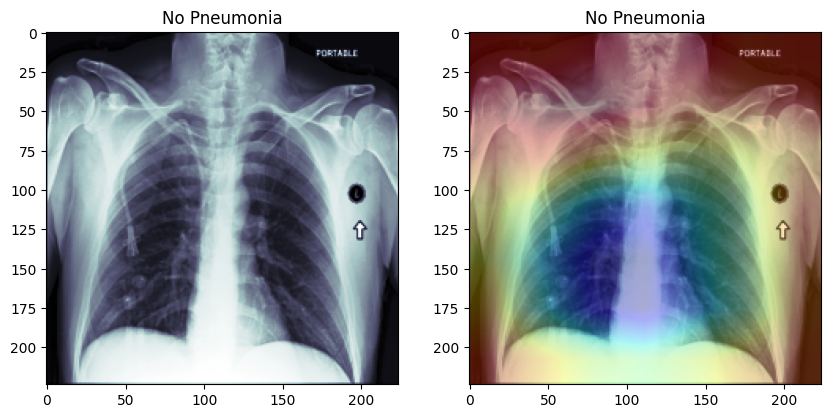

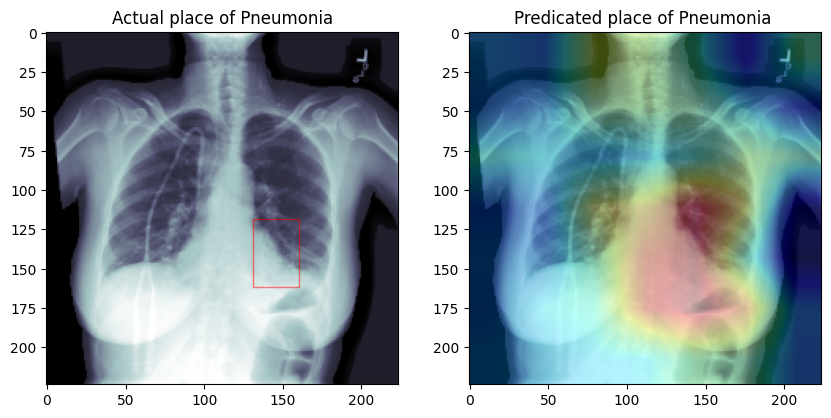

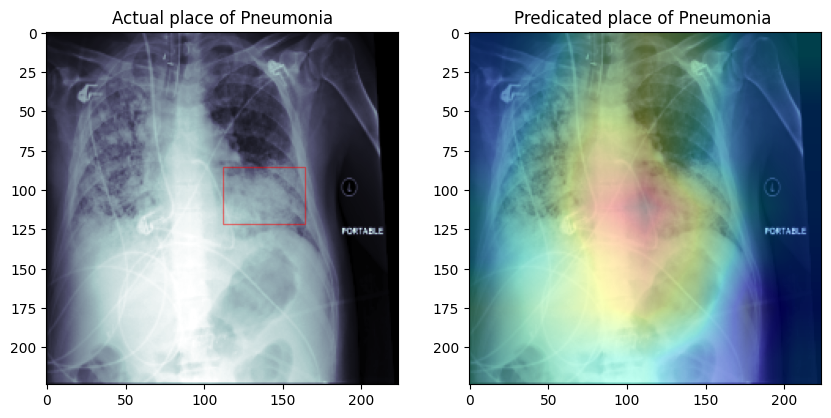

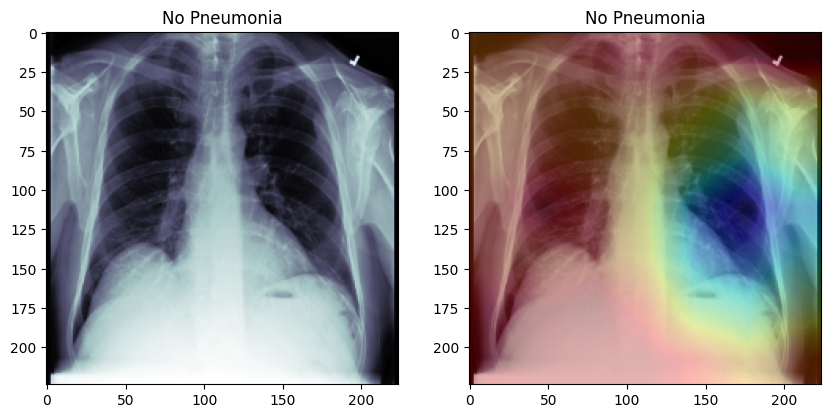

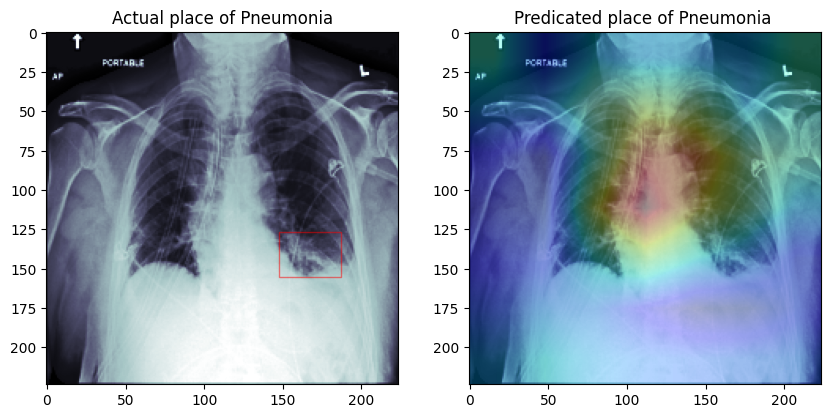

...

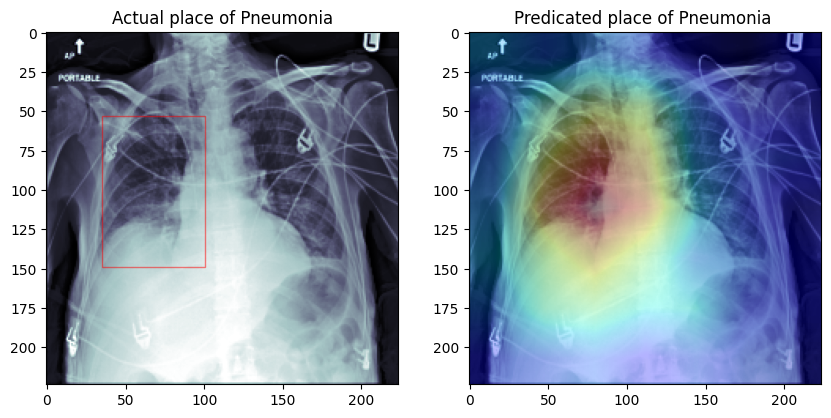

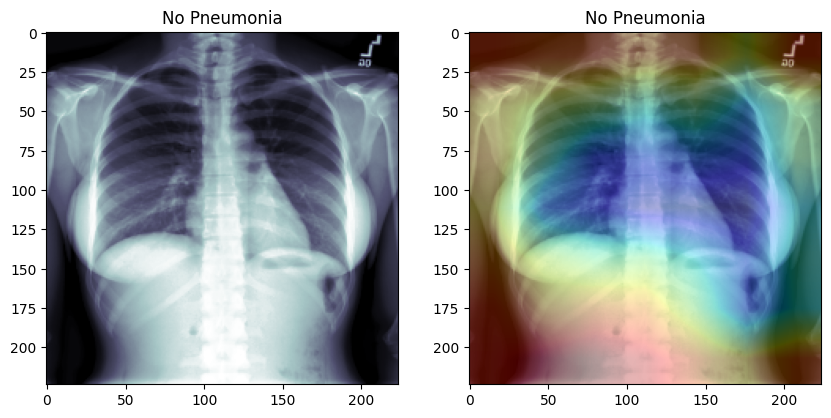

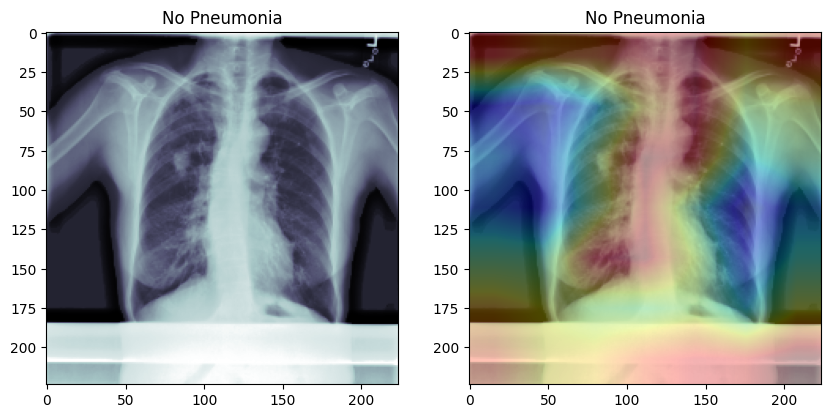

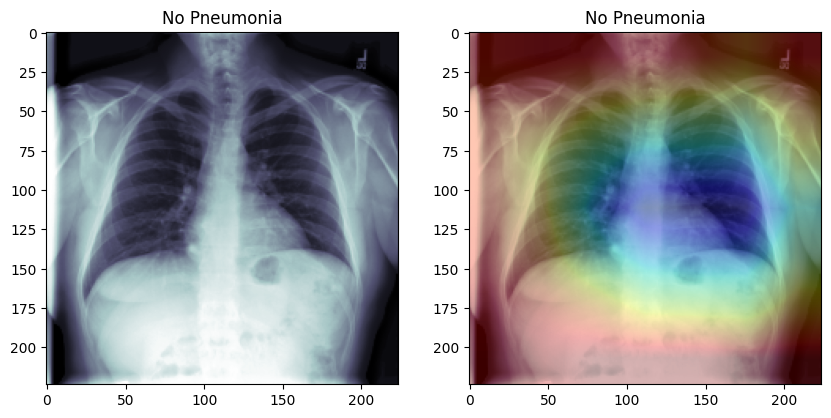

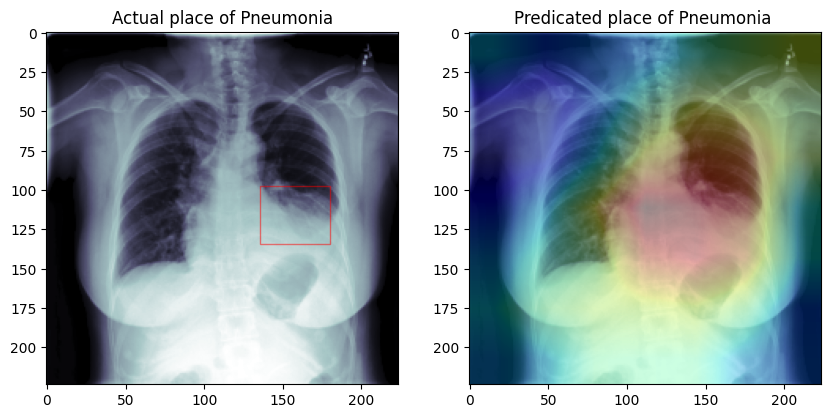

In [ ]:
count = 0
i = 0
while(count < 20):
    id = val_dataset[i]["id"]
    df = labels.loc[labels.patientId == id]
    img = val_dataset[i]["image"][0]
    activation_map, pred = cam(model, img.cuda())
    for _, row in df.iterrows():
        visualize_cam(img, activation_map, pred, df, row.Target)
        count +=1
        break
    i += 1
